In [ ]:
import pathlib
import glob 
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from keras.applications.resnet_v2 import ResNet50V2

%matplotlib inline

In [ ]:
#dataset url
dataset_url = 'https://personal.utdallas.edu/~mxm190127/dog-breed-identification/dataset.tgz'

#tf-hub model
base_model = "https://tfhub.dev/tensorflow/resnet_50/feature_vector/1"

#setting basic parameters
img_height = 224
img_width = 224

In [ ]:
#fetch dataset
data_dir = tf.keras.utils.get_file('dataset', origin=dataset_url, untar=True)
data_dir = pathlib.Path(data_dir)

772595712/772594759 [==============================] - 204s 0us/step


In [ ]:
#remove files with invalid filenames
names = list(data_dir.glob('*/.*.jpg'))
for file in names:
  os.remove(file)

In [ ]:
train_set = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=5,
  image_size=(img_height, img_width),
  batch_size=48)

Found 20580 files belonging to 120 classes.
Using 16464 files for training.


In [ ]:
val_set = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=5,
  image_size=(img_height, img_width),
  batch_size=25)

Found 20580 files belonging to 120 classes.
Using 4116 files for validation.


In [ ]:
#removing extra characters from class labels
train_set.class_names = ["".join(name.split('-')[1:]) for name in train_set.class_names]
print(train_set.class_names)

val_set.class_names = ["".join(name.split('-')[1:]) for name in val_set.class_names]
print(val_set.class_names)

['Chihuahua', 'Japanese_spaniel', 'Maltese_dog', 'Pekinese', 'ShihTzu', 'Blenheim_spaniel', 'papillon', 'toy_terrier', 'Rhodesian_ridgeback', 'Afghan_hound', 'basset', 'beagle', 'bloodhound', 'bluetick', 'blackandtan_coonhound', 'Walker_hound', 'English_foxhound', 'redbone', 'borzoi', 'Irish_wolfhound', 'Italian_greyhound', 'whippet', 'Ibizan_hound', 'Norwegian_elkhound', 'otterhound', 'Saluki', 'Scottish_deerhound', 'Weimaraner', 'Staffordshire_bullterrier', 'American_Staffordshire_terrier', 'Bedlington_terrier', 'Border_terrier', 'Kerry_blue_terrier', 'Irish_terrier', 'Norfolk_terrier', 'Norwich_terrier', 'Yorkshire_terrier', 'wirehaired_fox_terrier', 'Lakeland_terrier', 'Sealyham_terrier', 'Airedale', 'cairn', 'Australian_terrier', 'Dandie_Dinmont', 'Boston_bull', 'miniature_schnauzer', 'giant_schnauzer', 'standard_schnauzer', 'Scotch_terrier', 'Tibetan_terrier', 'silky_terrier', 'softcoated_wheaten_terrier', 'West_Highland_white_terrier', 'Lhasa', 'flatcoated_retriever', 'curlycoat

In [ ]:
#normalizing the data
normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)
norm_train_set = train_set.map(lambda x, y: (normalization_layer(x), y))
norm_val_set = val_set.map(lambda x, y: (normalization_layer(x), y))

In [ ]:
def plotGraphs(h):
  plt.plot(h.history['accuracy'])
  plt.plot(h.history['val_accuracy'])
  plt.title('Model accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  plt.plot(h.history['loss'])
  plt.plot(h.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

In [ ]:
def plotImages(images, labels, predictions):
  plt.figure(figsize=(20,20))
  for i in range(25):
    plt.subplot(5,5,i+1)
    title = f'True label: {val_set.class_names[labels[i]]} \n Predicted label: {val_set.class_names[predictions[i]]}'
    plt.title(title)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i])
  plt.show()

def plotResults(model):
  for images, labels in norm_val_set.take(1):
    numpy_images = images.numpy()
    numpy_labels = labels.numpy()

  pred = []
  for img in numpy_images:
    x = np.expand_dims(img, axis=0)
    pred.append(np.argmax(model.predict(x), axis=-1)[0])

  plotImages(numpy_images, numpy_labels, pred)

In [ ]:
def compileAndRunModel(model, epochs, learning_rate=0.01):
  model.build([None, img_height, img_width, 3])
  print(model.summary())

  model.compile(
      optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
      metrics=['accuracy'], 
      loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
  )

  history = model.fit(norm_train_set, validation_data=norm_val_set, epochs=epochs)

  return history

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_1 (KerasLayer)   (None, 2048)              23561152  
_________________________________________________________________
dense_1 (Dense)              (None, 120)               245880    
Total params: 23,807,032
Trainable params: 245,880
Non-trainable params: 23,561,152
_________________________________________________________________
None
Epoch 1/10
343/343 [==============================] - 68s 183ms/step - loss: 3.5784 - accuracy: 0.6192 - val_loss: 2.8796 - val_accuracy: 0.7225
Epoch 2/10
343/343 [==============================] - 64s 186ms/step - loss: 1.8710 - accuracy: 0.7986 - val_loss: 3.4794 - val_accuracy: 0.7267
Epoch 3/10
343/343 [==============================] - 65s 189ms/step - loss: 1.3788 - accuracy: 0.8494 - val_loss: 4.3681 - val_accuracy: 0.7104
Epoch 4/10
343/343 [==============================] - 66s 

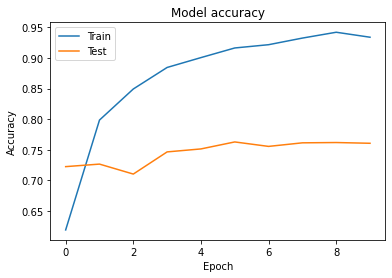

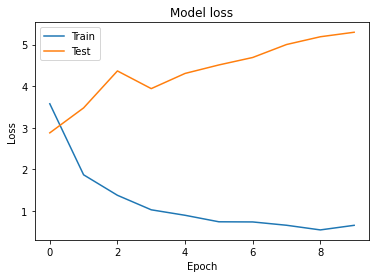

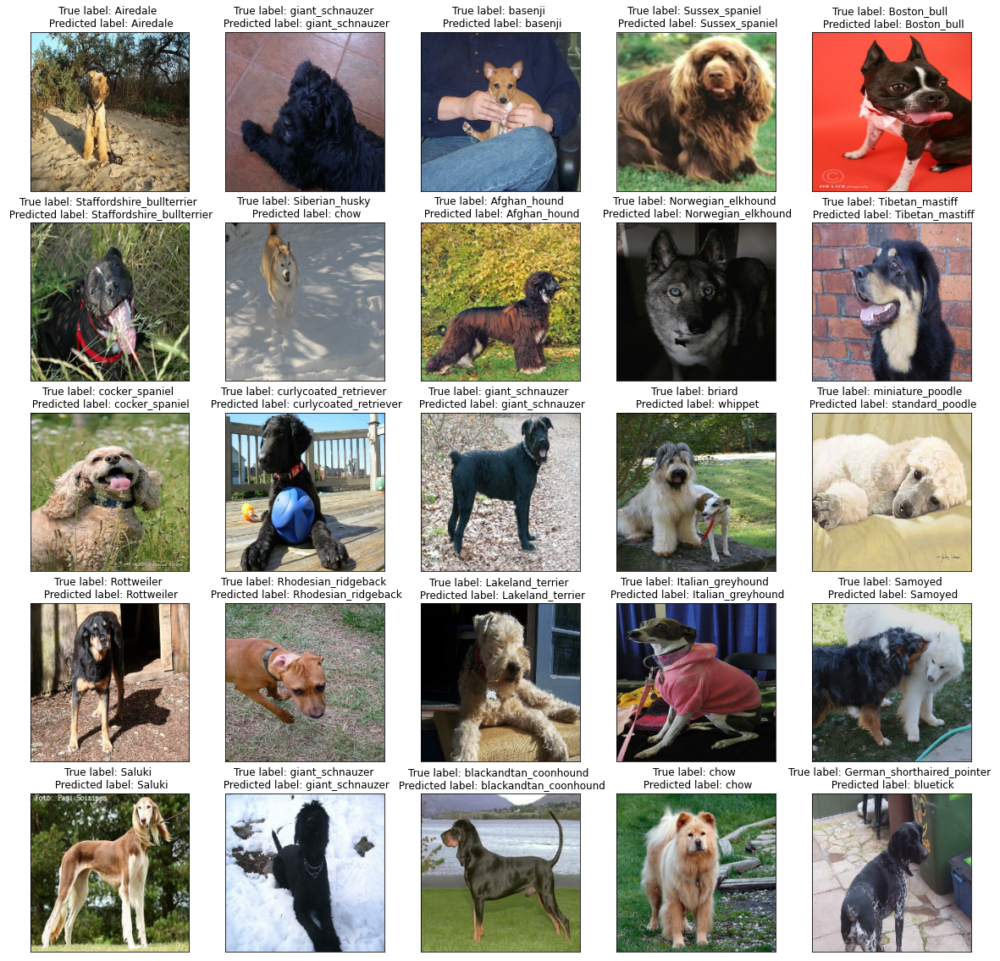

In [ ]:
#experiment 1
m = tf.keras.Sequential([
                         hub.KerasLayer(base_model, trainable=False),
                         tf.keras.layers.Dense(120)
                         ])

history = compileAndRunModel(m, 10)
print(f'Train Accuracy: {history.history["accuracy"][-1]} \n Test Accuracy: {history.history["val_accuracy"][-1]}')
print(f'Train Loss: {history.history["loss"][-1]} \n Test Loss: {history.history["val_loss"][-1]}')
plotGraphs(history)
plotResults(m)

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_9 (KerasLayer)   (None, 2048)              23561152  
_________________________________________________________________
dense_25 (Dense)             (None, 128)               262272    
_________________________________________________________________
dropout_15 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_26 (Dense)             (None, 128)               16512     
_________________________________________________________________
dense_27 (Dense)             (None, 120)               15480     
Total params: 23,855,416
Trainable params: 294,264
Non-trainable params: 23,561,152
_________________________________________________________________
None
Epoch 1/10
343/343 [==============================] - 72s 196ms/step - loss: 2.9854 - accuracy: 0

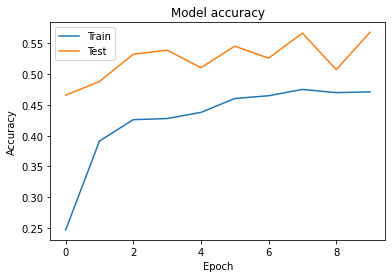

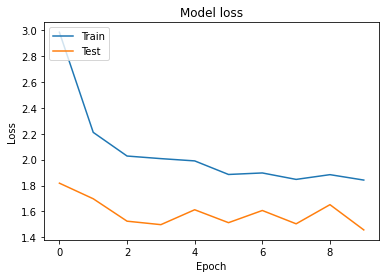

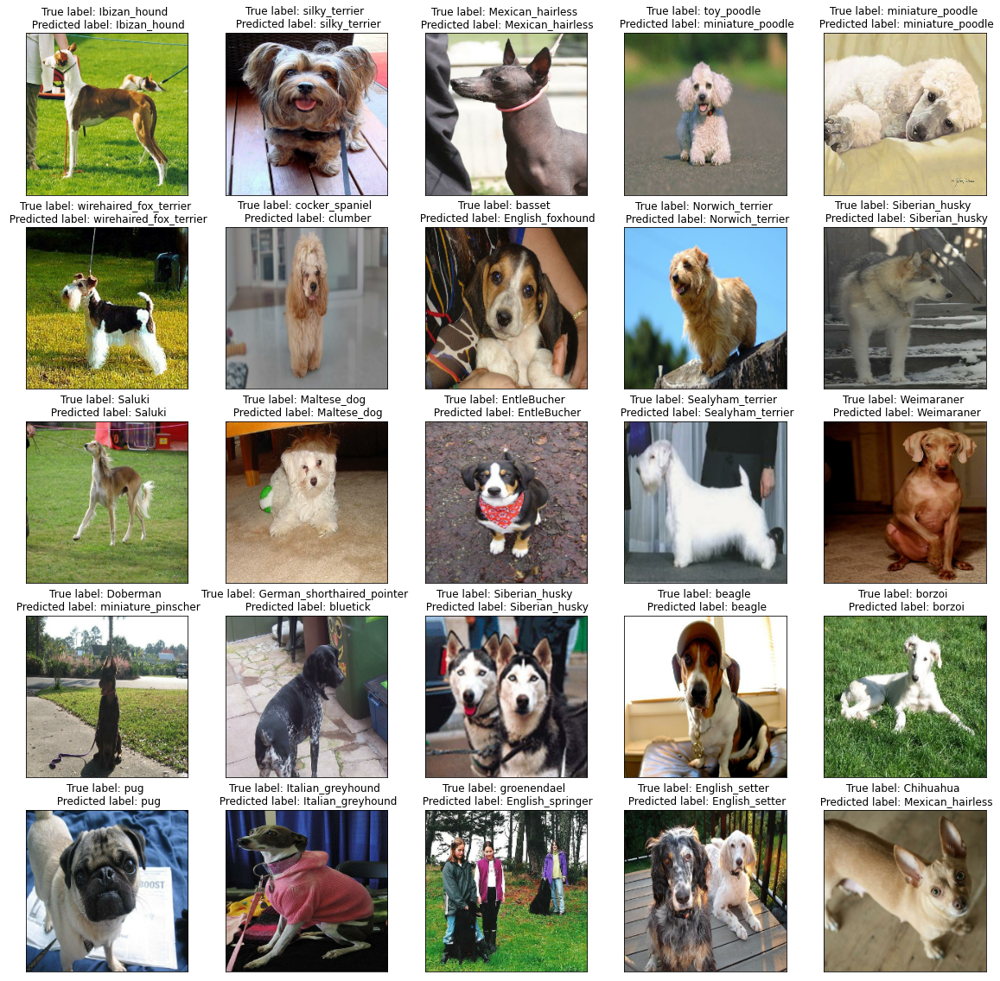

In [ ]:
#experiment 2
m = tf.keras.Sequential([
                         hub.KerasLayer(base_model, trainable=False),
                         tf.keras.layers.Dense(128, activation='relu'),
                         tf.keras.layers.Dropout(rate=0.2),
                         tf.keras.layers.Dense(128, activation='relu'),
                         tf.keras.layers.Dense(120)
                         ])

history = compileAndRunModel(m, 10)
print(f'Train Accuracy: {history.history["accuracy"][-1]} \n Test Accuracy: {history.history["val_accuracy"][-1]}')
print(f'Train Loss: {history.history["loss"][-1]} \n Test Loss: {history.history["val_loss"][-1]}')
plotGraphs(history)
plotResults(m)

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
random_flip (RandomFlip)     (None, 224, 224, 3)       0         
_________________________________________________________________
random_rotation (RandomRotat (None, 224, 224, 3)       0         
_________________________________________________________________
random_zoom (RandomZoom)     (None, 224, 224, 3)       0         
_________________________________________________________________
keras_layer_10 (KerasLayer)  (None, 2048)              23561152  
_________________________________________________________________
dense_28 (Dense)             (None, 128)               262272    
_________________________________________________________________
dense_29 (Dense)             (None, 128)               16512     
_________________________________________________________________
dense_30 (Dense)             (None, 120)             

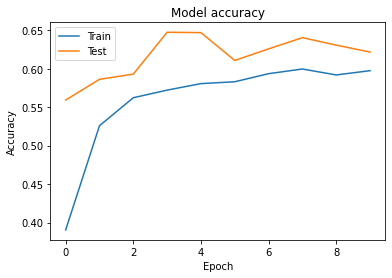

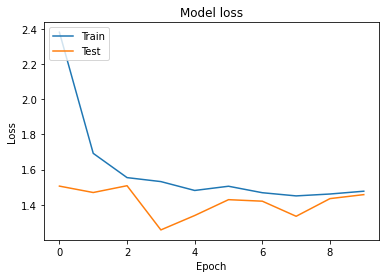

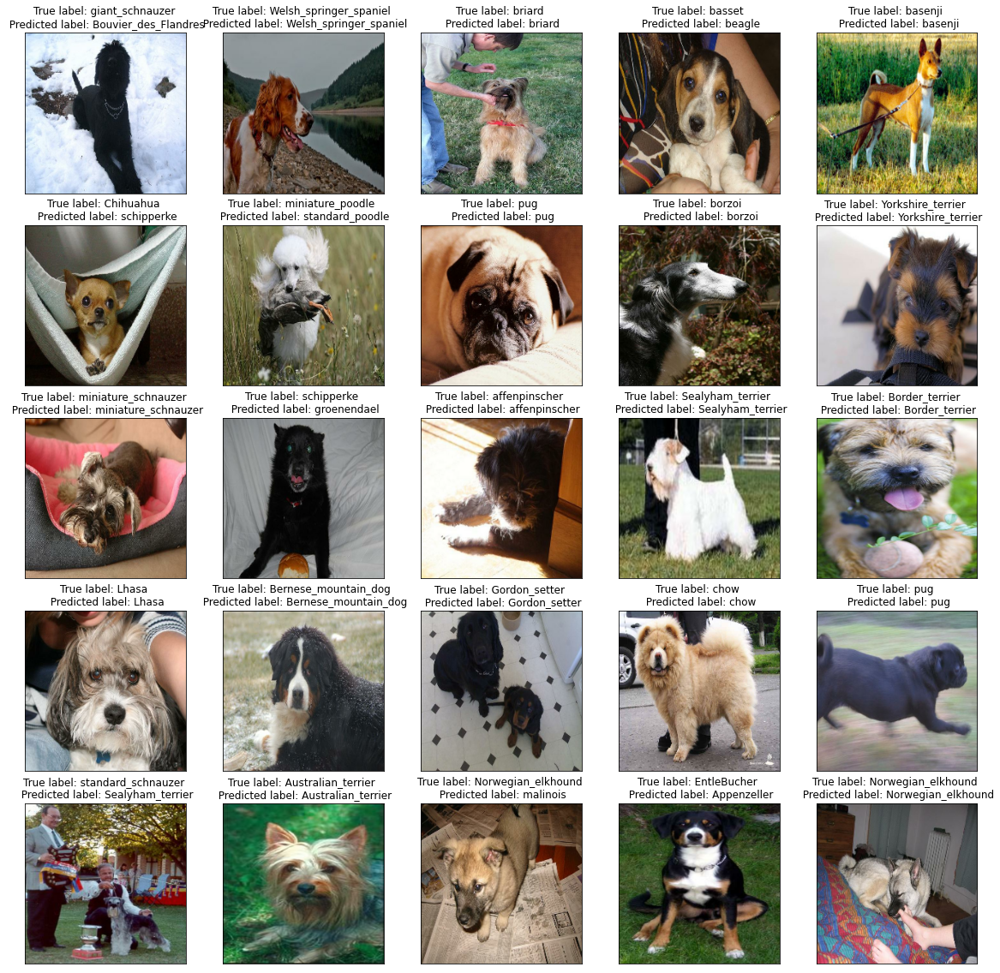

In [ ]:
#experiment 3
m = tf.keras.Sequential([
                         layers.experimental.preprocessing. ("horizontal", input_shape=(img_height, img_width, 3)),
                         layers.experimental.preprocessing.RandomRotation(0.1),
                         layers.experimental.preprocessing.RandomZoom(0.1),
                         hub.KerasLayer(base_model, trainable=False),
                         tf.keras.layers.Dense(128, activation='relu'),
                         tf.keras.layers.Dense(128, activation='relu'),
                         tf.keras.layers.Dense(120)
                         ])

history = compileAndRunModel(m, 10)
print(f'Train Accuracy: {history.history["accuracy"][-1]} \n Test Accuracy: {history.history["val_accuracy"][-1]}')
print(f'Train Loss: {history.history["loss"][-1]} \n Test Loss: {history.history["val_loss"][-1]}')
plotGraphs(history)
plotResults(m)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
random_flip (RandomFlip)     (None, 224, 224, 3)       0         
_________________________________________________________________
random_rotation (RandomRotat (None, 224, 224, 3)       0         
_________________________________________________________________
random_zoom (RandomZoom)     (None, 224, 224, 3)       0         
_________________________________________________________________
keras_layer (KerasLayer)     (None, 2048)              23561152  
_________________________________________________________________
dense (Dense)                (None, 120)               245880    
Total params: 23,807,032
Trainable params: 245,880
Non-trainable params: 23,561,152
_________________________________________________________________
None
Epoch 1/15
343/343 [==============================] - 106s 205ms/step - loss: 1.5498 - accuracy: 0.

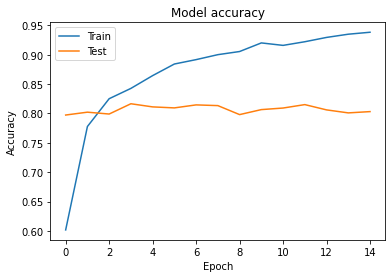

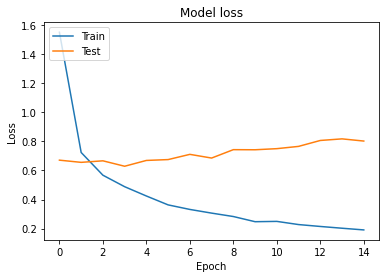

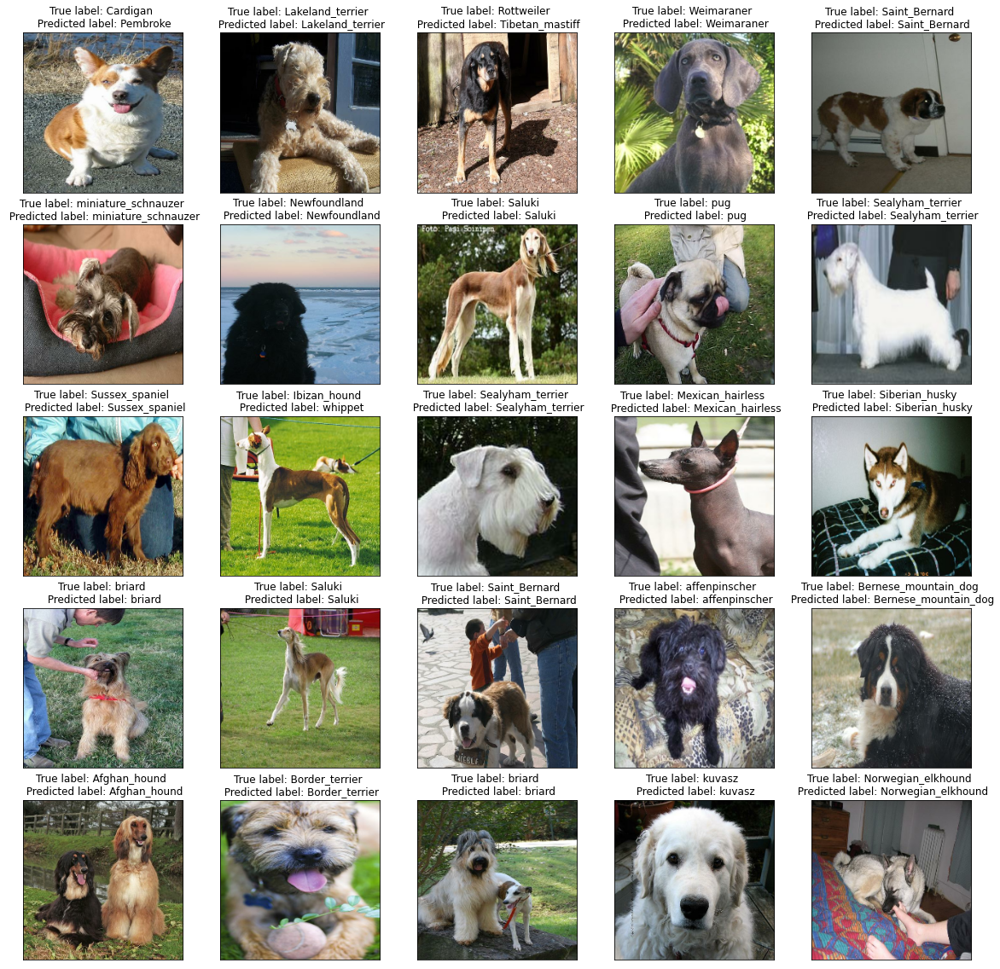

In [ ]:
#experiment 4
m = tf.keras.Sequential([
                         layers.experimental.preprocessing.RandomFlip("horizontal", input_shape=(img_height, img_width, 3)),
                         layers.experimental.preprocessing.RandomRotation(0.1),
                         layers.experimental.preprocessing.RandomZoom(0.1),
                         hub.KerasLayer(base_model, trainable=False),
                         tf.keras.layers.Dense(120)
                         ])

history = compileAndRunModel(m, 15, learning_rate=0.001)
print(f'Train Accuracy: {history.history["accuracy"][-1]} \n Test Accuracy: {history.history["val_accuracy"][-1]}')
print(f'Train Loss: {history.history["loss"][-1]} \n Test Loss: {history.history["val_loss"][-1]}')
plotGraphs(history)
plotResults(m)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
random_flip_1 (RandomFlip)   (None, 224, 224, 3)       0         
_________________________________________________________________
keras_layer_1 (KerasLayer)   (None, 2048)              23561152  
_________________________________________________________________
dense_1 (Dense)              (None, 256)               524544    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_3 (Dense)              (None, 120)               15480     
Total params: 24,134,072
Trainable params: 572,920
Non-trainable params: 23,561,152
____________________________________

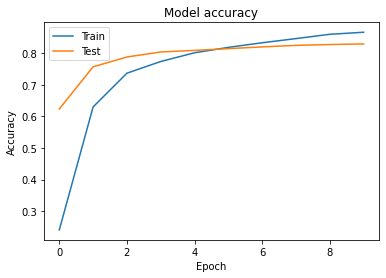

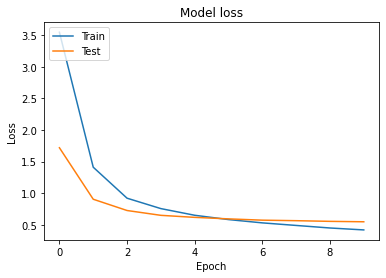

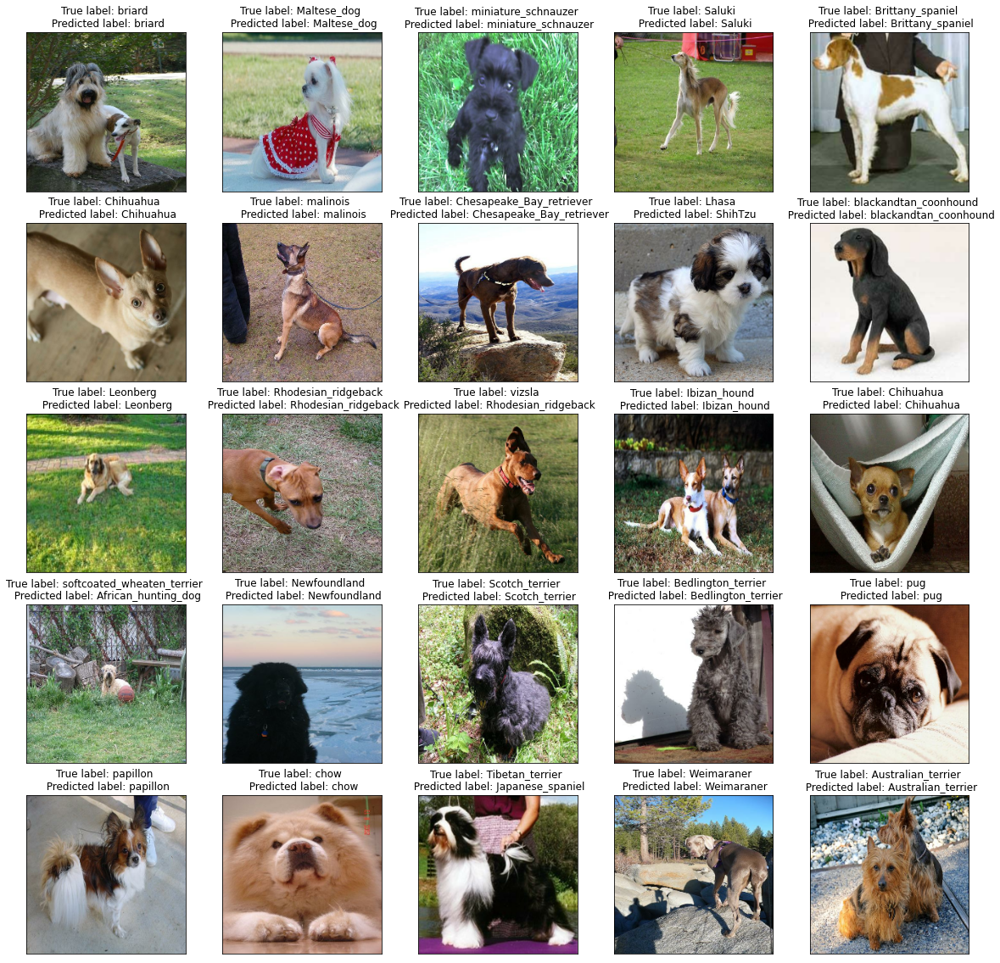

In [ ]:
#experiment 5
m = tf.keras.Sequential([
                         layers.experimental.preprocessing.RandomFlip("horizontal", input_shape=(img_height, img_width, 3)),
                         hub.KerasLayer(base_model, trainable=False),
                         tf.keras.layers.Dense(256, activation='relu'),
                         tf.keras.layers.Dropout(rate=0.2),
                         tf.keras.layers.Dense(128, activation='relu'),
                         tf.keras.layers.Dense(120)
                         ])

history = compileAndRunModel(m, 10, learning_rate=0.0001)
print(f'Train Accuracy: {history.history["accuracy"][-1]} \n Test Accuracy: {history.history["val_accuracy"][-1]}')
print(f'Train Loss: {history.history["loss"][-1]} \n Test Loss: {history.history["val_loss"][-1]}')
plotGraphs(history)
plotResults(m)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
random_flip_2 (RandomFlip)   (None, 224, 224, 3)       0         
_________________________________________________________________
random_rotation_1 (RandomRot (None, 224, 224, 3)       0         
_________________________________________________________________
random_zoom_1 (RandomZoom)   (None, 224, 224, 3)       0         
_________________________________________________________________
keras_layer_2 (KerasLayer)   (None, 2048)              23561152  
_________________________________________________________________
dropout_1 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 256)               524544    
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)              

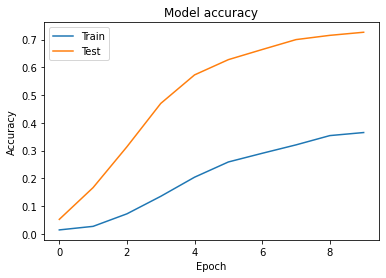

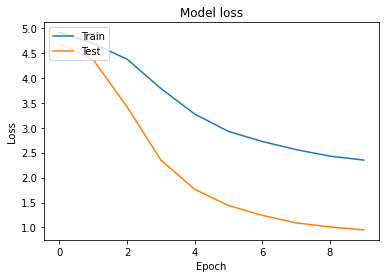

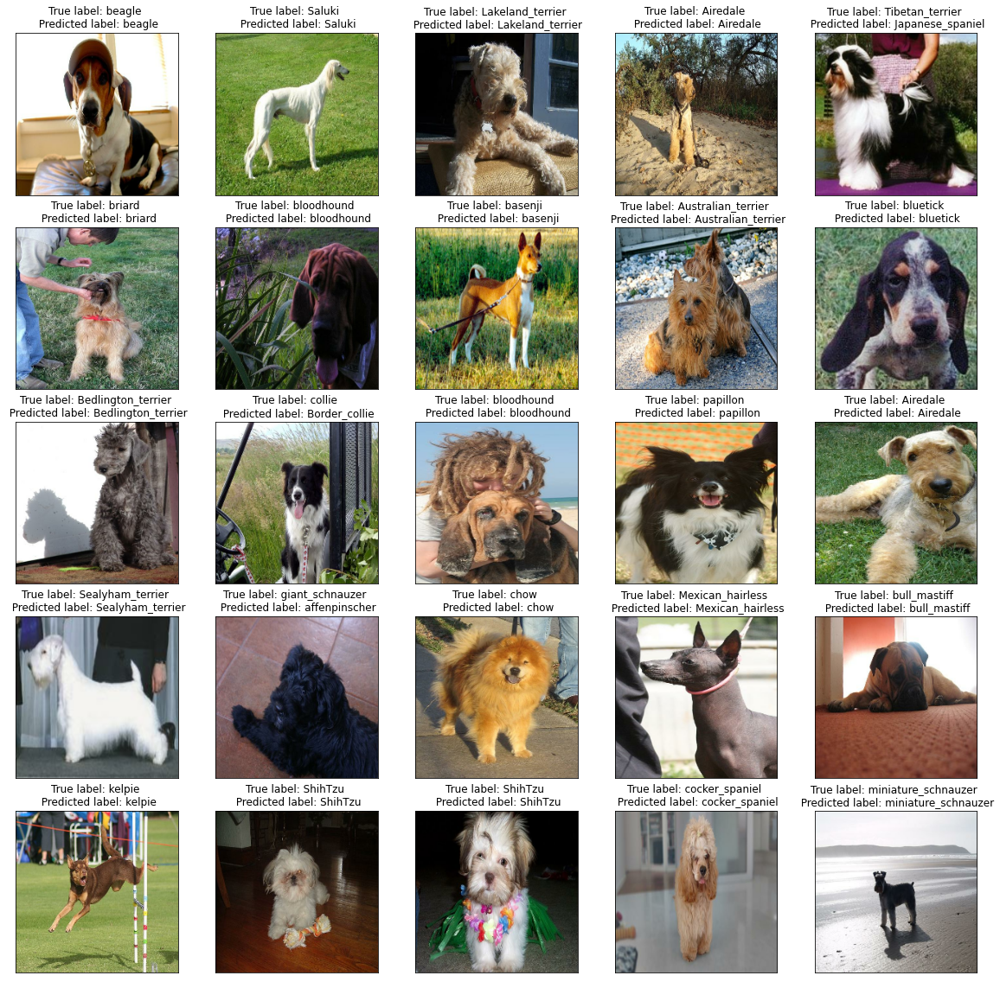

In [ ]:
#experiment 6
m = tf.keras.Sequential([
                         layers.experimental.preprocessing.RandomFlip("horizontal", input_shape=(img_height, img_width, 3)),
                         layers.experimental.preprocessing.RandomRotation(0.3),
                         layers.experimental.preprocessing.RandomZoom(0.3),
                         hub.KerasLayer(base_model, trainable=False),
                         tf.keras.layers.Dropout(rate=0.5),
                         tf.keras.layers.Dense(256, activation='relu'),
                         tf.keras.layers.Dropout(rate=0.5),
                         tf.keras.layers.Dense(128, activation='relu'),
                         tf.keras.layers.Dense(120)
                         ])

history = compileAndRunModel(m, 10, learning_rate=0.0001)
print(f'Train Accuracy: {history.history["accuracy"][-1]} \n Test Accuracy: {history.history["val_accuracy"][-1]}')
print(f'Train Loss: {history.history["loss"][-1]} \n Test Loss: {history.history["val_loss"][-1]}')
plotGraphs(history)
plotResults(m)

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
random_rotation_4 (RandomRot (None, 224, 224, 3)       0         
_________________________________________________________________
random_zoom_4 (RandomZoom)   (None, 224, 224, 3)       0         
_________________________________________________________________
keras_layer_5 (KerasLayer)   (None, 7, 7, 2048)        23564800  
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 3, 32)          1638432   
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 1, 1, 32)          0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 32)                0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 32)               

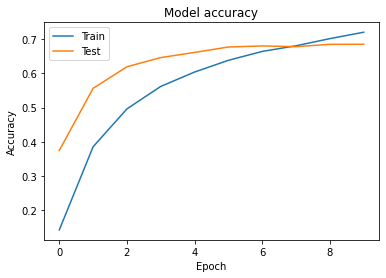

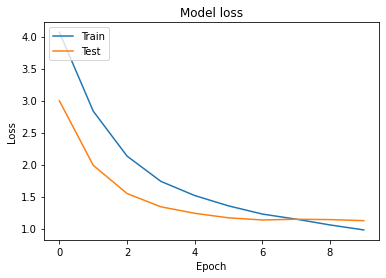

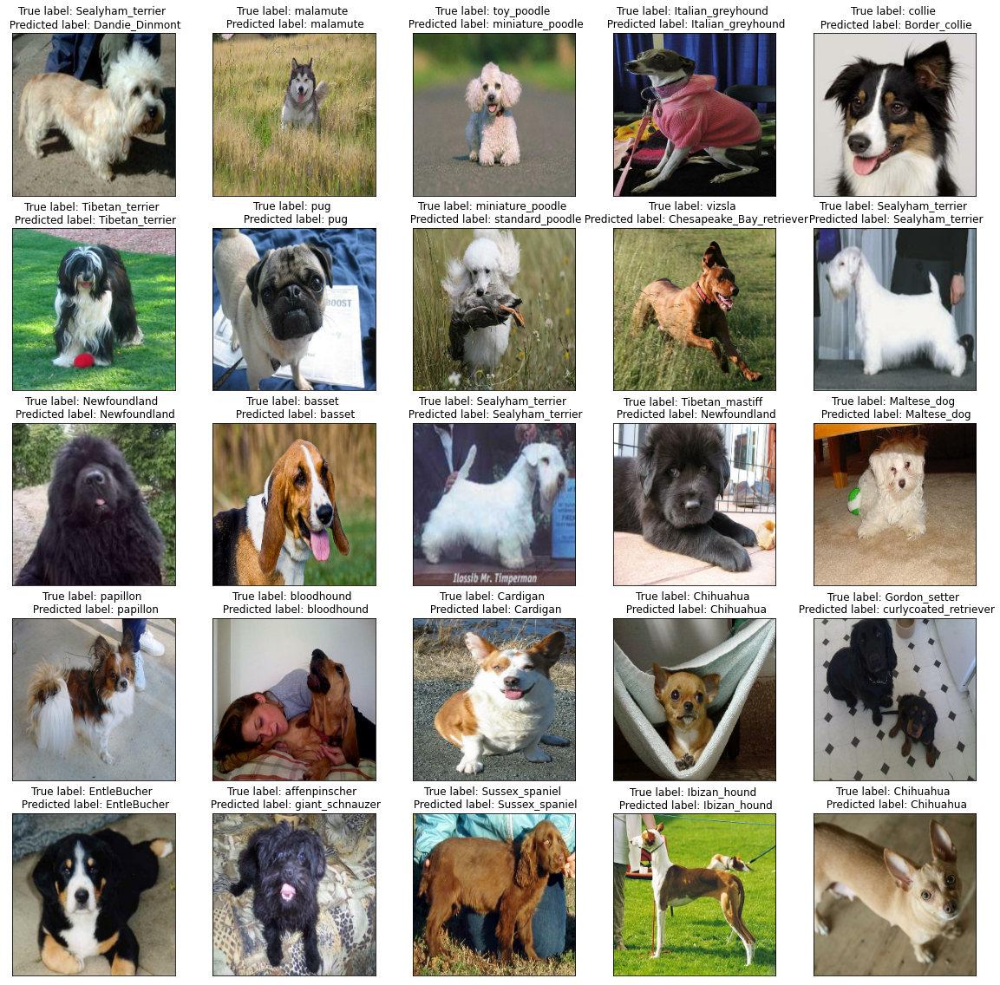

In [ ]:
#experiment 7
resnet = ResNet50V2(input_shape=[img_height,img_width,3], weights='imagenet',include_top=False)

m = tf.keras.Sequential([
                         layers.experimental.preprocessing.RandomRotation(0.1),
                         layers.experimental.preprocessing.RandomZoom(0.1),
                         hub.KerasLayer(resnet, trainable=False),
                         layers.Conv2D(32, (5, 5), activation='relu'),
                         layers.MaxPooling2D(pool_size=(2, 2)),
                         tf.keras.layers.Flatten(),
                         tf.keras.layers.BatchNormalization(),
                         tf.keras.layers.Dense(256, activation='relu'),
                         tf.keras.layers.Dropout(rate=0.2),
                         tf.keras.layers.BatchNormalization(),
                         tf.keras.layers.Dense(128, activation='relu'),                         
                         tf.keras.layers.Dense(120)
                         ])

history = compileAndRunModel(m, 10, learning_rate=0.0001)
print(f'Train Accuracy: {history.history["accuracy"][-1]} \n Test Accuracy: {history.history["val_accuracy"][-1]}')
print(f'Train Loss: {history.history["loss"][-1]} \n Test Loss: {history.history["val_loss"][-1]}')
plotGraphs(history)
plotResults(m)
